In [ ]:
# Problem Statement :

# 1. In industries, understanding the demands of wine safety testing can be acomplex task
# for laboratory with numerous analysts and residues to monitor.
# 2.But, our applications prediction, provide ideal solutions for the analysis of wine,
# which will make this whole process efficient & cheaper with less human interaction.

# Objective:

# Our main Objective is to predict the wine quality using ML learning thru Python PL
# A large dataset is considered and wine quality is modelled to analyse the quality of wine
# thru different parameters like fixed acidity, volatile acidity etc.
# All these parameters will be analysed thru ML Algorithms like random forest classifier Algorithm
# which will help us to rate the wine on scale 1-10 or bad-good
# Output obtained will be further checked for correctness and model will be optimized accordingly
# It can support the wine expert evaluations and ultimately improve the production
# Target Variable : Quality

In [ ]:
# Steps: Capstone Project

# 1.Installing neccesary dependencies
# 2.Uploading data into IDE for EDA
# 3.EDA Report creation & Visualization
# 4.Visualising & Treating Outliers using Median Imputation
# 5.Creating & splitting Wine quality into 3 classes :
#       0~4 : Poor Quality, 5~6 : Avg Qulaity, 7~8: Good Quality
# 6.Using LabelEncoder to Encode categorical input of Wine quality classes
# 7.Separating Features & Target Variables
# 8.Creating train_test_split

# 9.Tree Based Models :
#  9a.RF Model creation 
#    9a(i)  Without Hyperparameters
#    9a(ii) With Hyperparameters using RandomizedSearch CV
#                                using GridSearch CV
#  9b.DT Model creation          
#  9c.Gaussian Naive Bayes Model creation 

# 10.Gradient Descent Based Models :
#  10a.Logistic Regression

# 11.Distance Based Models :
#  11a.K Nearest Neighbors
#  11b.Support Vector Machine

# 12.Feature Scaling (Use of StandardScalar)
# 13.Visualizations :
#  13a.Confusion Matrix
#  13a.ROC & AUC
#  13b.Precision vs Recall Curve (with respective Classification Report)
# 14.Complete Summarised Performance Metrics

In [ ]:
!pip install pandas-profiling=='2.7.1'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 252 kB 8.3 MB/s 
     |████████████████████████████████| 690 kB 46.4 MB/s 
     |████████████████████████████████| 4.7 MB 44.7 MB/s 
     |████████████████████████████████| 58 kB 7.5 MB/s 
     |████████████████████████████████| 812 kB 57.0 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=25f0cc9cb98eba21faac965ea0d123aac28833b5dece7611953f6522e2ebeaae
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295206 sha256=486176d0b85d0764768c6f47662a2888478959f89958c627e5d946e4faa3bf6d
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin i

In [ ]:
# Import basic modules
import io
from google.colab import files
from google.colab import data_table

import numpy as np
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import random

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, ComplementNB    
from sklearn import metrics
from imblearn.under_sampling import TomekLinks
from imblearn.over_sampling import SMOTE 


from sklearn.metrics import roc_curve, auc, confusion_matrix, plot_confusion_matrix
from sklearn.metrics import classification_report , accuracy_score, roc_auc_score, roc_curve, precision_recall_curve,f1_score
from sklearn.preprocessing import RobustScaler, StandardScaler,MinMaxScaler,MaxAbsScaler, LabelEncoder
from sklearn.multiclass import OneVsRestClassifier
from yellowbrick.classifier import ROCAUC, PrecisionRecallCurve
     
import warnings
warnings.filterwarnings('ignore')

In [ ]:
uploaded = files.upload()
df = pd.read_csv(io.BytesIO(uploaded['QualityPrediction.csv']))

Saving QualityPrediction.csv to QualityPrediction (4).csv


In [ ]:
from google.colab import data_table
data_table.enable_dataframe_formatter()
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
# Exhaustive EDA Report

In [ ]:
pandas_profiling.ProfileReport(df,title='Wine Quality EDA')

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Visualising & treating Outliers

[Text(0, 0, 'fixed acidity'),
 Text(0, 0, 'volatile acidity'),
 Text(0, 0, 'citric acid'),
 Text(0, 0, 'residual sugar'),
 Text(0, 0, 'chlorides'),
 Text(0, 0, 'free sulfur dioxide'),
 Text(0, 0, 'total sulfur dioxide'),
 Text(0, 0, 'density'),
 Text(0, 0, 'pH'),
 Text(0, 0, 'sulphates'),
 Text(0, 0, 'alcohol'),
 Text(0, 0, 'quality')]

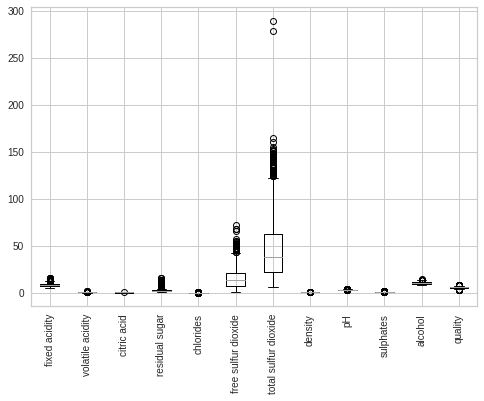

In [ ]:
ax = df.boxplot()
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

In [ ]:
outlier_tsd = df['total sulfur dioxide'].values>200
df[outlier_tsd]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1079,7.9,0.3,0.68,8.3,0.05,37.5,278.0,0.99316,3.01,0.51,12.3,7
1081,7.9,0.3,0.68,8.3,0.05,37.5,289.0,0.99316,3.01,0.51,12.3,7


In [ ]:
# Median Imputation for Extreme Outliers
df_replace = df['total sulfur dioxide'].replace({278:38 , 289:38},inplace=True)
df_replace

In [ ]:
outlier_tsd = df['total sulfur dioxide'].values>200
df[outlier_tsd]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality


[Text(0, 0, 'fixed acidity'),
 Text(0, 0, 'volatile acidity'),
 Text(0, 0, 'citric acid'),
 Text(0, 0, 'residual sugar'),
 Text(0, 0, 'chlorides'),
 Text(0, 0, 'free sulfur dioxide'),
 Text(0, 0, 'total sulfur dioxide'),
 Text(0, 0, 'density'),
 Text(0, 0, 'pH'),
 Text(0, 0, 'sulphates'),
 Text(0, 0, 'alcohol'),
 Text(0, 0, 'quality')]

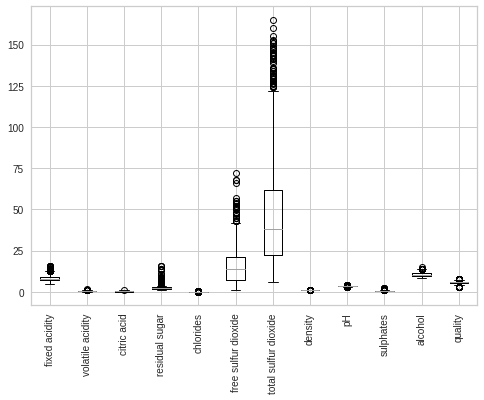

In [ ]:
ax = df.boxplot()
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

In [ ]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [ ]:
# df.drop_duplicates(subset=df.columns,keep='first',inplace=True)

In [ ]:
print(df['quality'].value_counts().sum())
print(df['quality'].value_counts())
print(set(df['quality'].values))

1599
5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64
{3, 4, 5, 6, 7, 8}


In [ ]:
# Separating features & Target Variables
# X = df.drop('quality',axis=1)
# y = df['quality'].apply(lambda y_value : 1 if y_value >= 7 else 0)

In [ ]:
df['quality_group'] = df['quality']
df.head()
if df['quality_group'].value_counts().all() == df['quality'].value_counts().all():
  print("Both groups are identical")
else:
  print("Some values aren't same")

Both groups are identical


In [ ]:
# Grouping quality ratings into 3 classes Avg, Good & Poor

dict = {3:'poor',4:'poor',5:'avg',6:'avg',7:'good', 8:'good'}
df['quality_group'].replace(dict,inplace=True)
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_group
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,avg
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,avg
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,avg
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,avg
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,avg
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,avg
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,avg
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,avg
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,avg


In [ ]:
# Use of LabelEncoder to encode categorical data in quality_group:
# 0 : Average, 1 : good, 2 : poor  (Alphabetical Order)

le=LabelEncoder()
le_quality_group=le.fit_transform(df['quality_group'])
df['le_quality_group']=le_quality_group
print(df['le_quality_group'].unique())
df

[0 1 2]


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_group,le_quality_group
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,avg,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,avg,0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,avg,0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,avg,0
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,avg,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,avg,0
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,avg,0
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,avg,0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,avg,0


In [ ]:
# Dropping off categorical quality_group & quality 

df.drop(columns=['quality_group','quality'],axis=1,inplace=True)

print(df['le_quality_group'].value_counts())

0    1319
1     217
2      63
Name: le_quality_group, dtype: int64


In [ ]:
# Separating features & Target Variables
X = df.drop('le_quality_group',axis=1)
y = df['le_quality_group']

In [ ]:
print(X.columns)

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')


In [ ]:
# Creating train_test_split

# stratify = y >>> I wanted to use this para in train_test_split but my 'Poor' class is not taken in test dataset 
#by most models

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.20, random_state=3) 

In [ ]:
print("Target Variable before sampling minority classes ")
y_train.value_counts()

Target Variable before sampling minority classes 


0    1050
1     180
2      49
Name: le_quality_group, dtype: int64

In [ ]:
y_test.value_counts()

0    269
1     37
2     14
Name: le_quality_group, dtype: int64

In [ ]:
# Underfitting occurs after applying this sampling techniques

# Undersampling Technique : Deletes data to make class balanced which may result in info loss

# t1 = TomekLinks()
# X_train, y_train = t1.fit_resample(X_train, y_train)

#Oversampling Technique : Generating artificial samples for creating enough training data

# sm = SMOTE(random_state=3)
# X_train, y_train = sm.fit_resample(X_train, y_train)

In [ ]:
# print("Target Variable after smoting minority classes ")
# y_train.value_counts()

In [ ]:
# Creating Tree Models
# 1. Random forest
# 2. Decision Tree
# 3. NaiveBayes

In [ ]:
# 1. Instantiation
model_rf = RandomForestClassifier(random_state=42)
model_dt = DecisionTreeClassifier(random_state=42)
model_gnb = GaussianNB()

# 2. Fitting model to training dataset
# No Scaling Required for Tree Models

model_rf.fit(X_train,y_train)             
model_dt.fit(X_train,y_train) 
model_gnb.fit(X_train,y_train)

# 3. Predicting Target variables from Actual(True) variables
y_pred_rf = model_rf.predict(X_test)
y_pred_dt = model_dt.predict(X_test)
y_pred_nb = model_gnb.predict(X_test)

# 4. Finding Accuracy Score

print('Accuracy before Hyperparams :')
print('>>> Accuracy for RF Model :',accuracy_score(y_test,y_pred_rf)*100)

print('>>> Accuracy for DT Model :',accuracy_score(y_test,y_pred_dt)*100)

print('>>> Accuracy for NB Model :',accuracy_score(y_test,y_pred_nb)*100)


Accuracy before Hyperparams :
>>> Accuracy for RF Model : 88.75
>>> Accuracy for DT Model : 83.125
>>> Accuracy for NB Model : 77.8125


In [ ]:
# Instantiation for Hyperparameter Tuning

model_rf_hp1 = RandomForestClassifier(random_state=1)
model_rf_hp2 = RandomForestClassifier(random_state=2)

In [ ]:
# RF Model : Hyperparameter Tuning using RandomizedSearchCV 

max_depth = [2,3,4,6,8,10]
n_estimators = [100,150,200,250,300,350,400,450,500]
param_dist = {
              'n_estimators':n_estimators,
              'max_features': ['auto', 'sqrt', 'log2', None],
              'bootstrap' : [True, False],
              'criterion': ['gini','entropy'],'oob_score' : [True,False],
              'min_samples_leaf' :[1, 2, 4],'min_samples_split' : [2, 5, 10],
              'max_depth' : max_depth
              }

# Running RandomizedSearchCV to check for all the different PnCs of above parameter values
random_rf = RandomizedSearchCV(model_rf_hp1, cv = 10,
                     param_distributions = param_dist, 
                     n_jobs = -1,verbose=2,n_iter=100)


#Fitting the train set , so that CV is executed on this dataset
random_rf.fit(X_train, y_train)

#Printing the best parameters by using best_params
print('Best Parameters using RandomizedSearchCV: \n', random_rf.best_params_)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Best Parameters using RandomizedSearchCV: 
 {'oob_score': True, 'n_estimators': 150, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 8, 'criterion': 'entropy', 'bootstrap': True}


In [ ]:
# RF Model : Hyperparameter Tuning using GridSearchCV 

param_dist = {'max_depth': [2, 3, 4],
              'max_features': ['auto', 'sqrt', 'log2', None],
                'bootstrap' : [True, False],
              'criterion': ['gini', 'entropy']}

# Running gridsearchCV to check for all the different PnCs of these parameter values
grid_rf = GridSearchCV(model_rf_hp2, cv = 10,
                     param_grid=param_dist, 
                     n_jobs = 3)

#Fitting the train set , so that grid search is executed on this dataset
grid_rf.fit(X_train, y_train)

#Printing the best parameters by using best_params
print('Best Parameters using grid search: \n', grid_rf.best_params_)   #to get best Hyperparameters

Best Parameters using grid search: 
 {'bootstrap': True, 'criterion': 'gini', 'max_depth': 4, 'max_features': None}


In [ ]:
model_rf_hp1.set_params(
                  oob_score = True, 
                  n_estimators=700,
                  min_samples_split= 5,
                  min_samples_leaf= 1,
                  max_features = 'log2',
                  max_depth = 8,
                  criterion= 'entropy',
                  bootstrap = True
                  )
model_rf_hp2.set_params(
                  max_features = None,
                  max_depth = 4,
                  criterion= 'gini',
                  bootstrap = True
                  )
print("RandomizedSearchCV Params >>>")
print(model_rf_hp1.get_params())
print("GridSearchCV Params >>>")
print(model_rf_hp2.get_params())

RandomizedSearchCV Params >>>
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 8, 'max_features': 'log2', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 5, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 700, 'n_jobs': None, 'oob_score': True, 'random_state': 1, 'verbose': 0, 'warm_start': False}
GridSearchCV Params >>>
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 4, 'max_features': None, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 2, 'verbose': 0, 'warm_start': False}


In [ ]:
# 2.Fitting model to Train Dataset
model_rf_hp1.fit(X_train,y_train)  
model_rf_hp2.fit(X_train,y_train)  

# 3. Model Prediction
y_pred_rf_hp1 = model_rf_hp1.predict(X_test)
y_pred_rf_hp2 = model_rf_hp2.predict(X_test)

# 4. Evaluation Metrics


print('Accuracy before Hyperparams for RF Model :')
print('>>> Accuracy for RF Model :',accuracy_score(y_test,y_pred_rf)*100)
print()
print('Accuracy after Hyperparams for RF Model :')
print('>>> Accuracy for RF Model using RandomizedSearchCV :',accuracy_score(y_test,y_pred_rf_hp1)*100)
print('>>> Accuracy for RF Model using GridSearchCV :',accuracy_score(y_test,y_pred_rf_hp2)*100)

Accuracy before Hyperparams for RF Model :
>>> Accuracy for RF Model : 88.75

Accuracy after Hyperparams for RF Model :
>>> Accuracy for RF Model using RandomizedSearchCV : 88.75
>>> Accuracy for RF Model using GridSearchCV : 86.25


In [ ]:
# Creating Distance based models
# 1. Logistic Regression
# 2. K Nearest Neighbors
# 3. Support Vector Machine

In [ ]:
# 1. Instantiation
model_lr = LogisticRegression(random_state=42)
model_knn = KNeighborsClassifier(n_neighbors=2) 
model_svc = SVC(random_state=3)

# 2. Fitting model to training dataset
model_lr.fit(X_train,y_train)
model_knn.fit(X_train,y_train)
model_svc.fit(X_train,y_train)

# 3. Predicting Target variables from Actual(True) variables
y_pred_lr = model_lr.predict(X_test)
y_pred_knn = model_knn.predict(X_test)
y_pred_svc = model_svc.predict(X_test)


# 4. Evaluation Metrics
labels = ['avg','good','poor']

LogReg = pd.DataFrame(classification_report(y_test,y_pred_lr,output_dict=True,target_names=labels))

KNN = pd.DataFrame(classification_report(y_test,y_pred_knn,output_dict=True,target_names=labels))

SVM = pd.DataFrame(classification_report(y_test,y_pred_svc,output_dict=True,target_names=labels))

df_combined_1 = pd.concat([LogReg,KNN,SVM],ignore_index=False,axis=0)

df_combined_1


,avg,good,poor,accuracy,macro avg,weighted avg
precision,0.881757,0.666667,0.0,0.865625,0.516141,0.818310
recall,0.970260,0.432432,0.0,0.865625,0.467564,0.865625
f1-score,0.923894,0.524590,0.0,0.865625,0.482828,0.837304
support,269.000000,37.000000,14.0,0.865625,320.000000,320.000000
precision,0.864238,0.555556,0.0,0.846875,0.473265,0.790737
recall,0.970260,0.270270,0.0,0.846875,0.413510,0.846875
f1-score,0.914186,0.363636,0.0,0.846875,0.425941,0.810533
support,269.000000,37.000000,14.0,0.846875,320.000000,320.000000
precision,0.840625,0.000000,0.0,0.840625,0.280208,0.706650
recall,1.000000,0.000000,0.0,0.840625,0.333333,0.840625


In [ ]:
# Using Standard Scaler Technique for Distance based models

In [ ]:
# Target variable scaling not required as the spread of values is not quite large
ss = StandardScaler()

X_train_scaled = ss.fit_transform(X_train)
print('X_train_scaled Data',X_train.shape)
X_train_scaled

X_test_scaled = ss.transform(X_test)
print('X_test_scaled Data',X_test.shape)
X_test_scaled

X_train_scaled Data (1279, 11)
X_test_scaled Data (320, 11)


array([[-0.4323034 , -0.20406246, -0.06349835, ..., -1.27975727,
         0.83152475, -1.0643838 ],
       [ 2.07991328,  0.57287617,  1.1639231 , ..., -1.53523931,
        -0.33827138, -0.02808828],
       [-0.37520757,  1.04458891, -1.34206235, ...,  0.63635802,
        -0.5137408 ,  1.29083328],
       ...,
       [-0.0897284 , -1.81343533,  0.80592518, ...,  1.40280413,
         0.89001456, -0.02808828],
       [ 0.88090077, -0.14856684,  1.1639231 , ..., -0.96040472,
         0.53907572, -1.53542721],
       [-0.37520757,  0.98909329, -0.88177931, ...,  0.508617  ,
        -0.98165926, -0.68754906]])

In [ ]:
# 1. Instantiation
model_lr_sc = LogisticRegression(random_state=42)
model_knn_sc = KNeighborsClassifier(n_neighbors=2) 
model_svc_sc = SVC(random_state=3)

# 2. Fitting model to training dataset
model_lr_sc.fit(X_train_scaled,y_train)
model_knn_sc.fit(X_train_scaled,y_train)
model_svc_sc.fit(X_train_scaled,y_train)

# 3. Predicting Target variables from Actual(True) variables
y_pred_lr_sc = model_lr_sc.predict(X_test_scaled)
y_pred_knn_sc = model_knn_sc.predict(X_test_scaled)
y_pred_svc_sc = model_svc_sc.predict(X_test_scaled)


# 4. Evaluation Metrics
labels = ['avg','good','poor']

LogReg_sc = pd.DataFrame(classification_report(y_test,y_pred_lr_sc,output_dict=True,target_names=labels))

KNN_sc = pd.DataFrame(classification_report(y_test,y_pred_knn_sc,output_dict=True,target_names=labels))

SVM_sc = pd.DataFrame(classification_report(y_test,y_pred_svc_sc,output_dict=True,target_names=labels))

df_combined_sc = pd.concat([LogReg_sc,KNN_sc,SVM_sc],ignore_index=False,axis=0)



print("Accuracy without scaled features")

print('>>> Accuracy for LogR Model :',accuracy_score(y_test,y_pred_lr)*100)

print('>>> Accuracy for KNN Model :',accuracy_score(y_test,y_pred_knn)*100)

print('>>> Accuracy for SVC Model :',accuracy_score(y_test,y_pred_svc)*100)
 
print()


print("Accuracy with scaled features")

print('>>> Accuracy for LogR Model :',accuracy_score(y_test,y_pred_lr_sc)*100)

print('>>> Accuracy for KNN Model :',accuracy_score(y_test,y_pred_knn_sc)*100)

print('>>> Accuracy for SVC Model :',accuracy_score(y_test,y_pred_svc_sc)*100)
 

Accuracy without scaled features
>>> Accuracy for LogR Model : 86.5625
>>> Accuracy for KNN Model : 84.6875
>>> Accuracy for SVC Model : 84.0625

Accuracy with scaled features
>>> Accuracy for LogR Model : 86.25
>>> Accuracy for KNN Model : 88.125
>>> Accuracy for SVC Model : 87.8125


Text(0, 0.5, 'Error Rate')

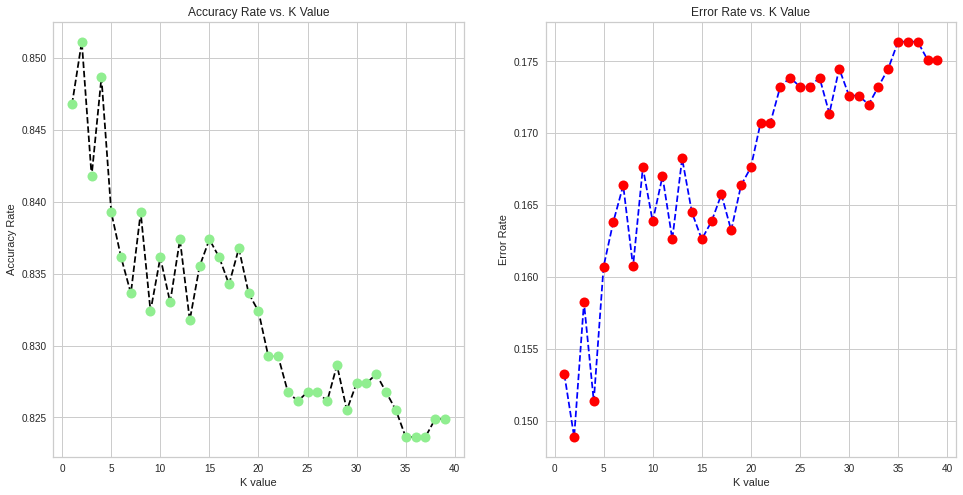

In [ ]:
# Visualising Accuracy & Error rate of KNN

accuracy_rate = []
error_rate = []

# May take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    score=cross_val_score(knn,df,df['le_quality_group'],cv=10)
    accuracy_rate.append(score.mean())
    error_rate.append(1-(score.mean()))

plt.figure(figsize=(25,8))

plt.subplot(131)
plt.plot(range(1,40),accuracy_rate,color='black', linestyle='dashed', marker='o',
         markerfacecolor='lightgreen', markersize=10)

plt.title('Accuracy Rate vs. K Value')
plt.xlabel('K value')
plt.ylabel('Accuracy Rate')


plt.subplot(132)
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K value')
plt.ylabel('Error Rate')

In [ ]:
# Combined Evaluation thru Visualization
# 1. Confusion Matrix
# 2. ROC & AUC
# 3. Precision vs Recall Curve for all 3 Classifier models
# 4. Plotting Errors in Prediction thru histogram

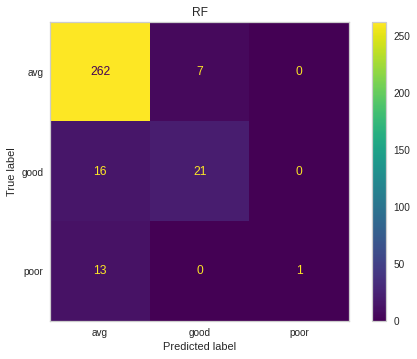

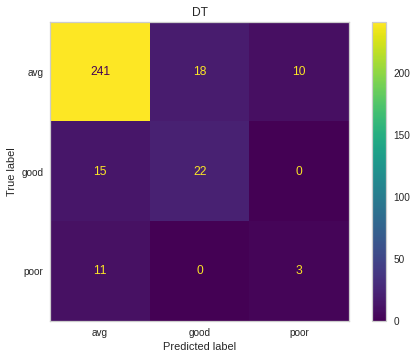

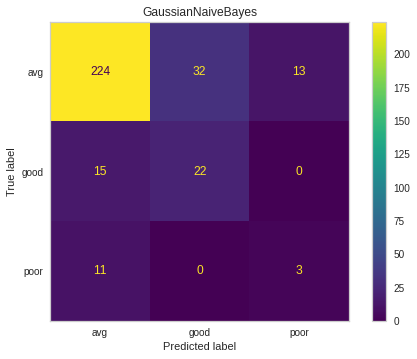

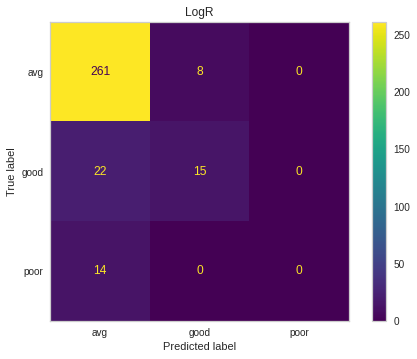

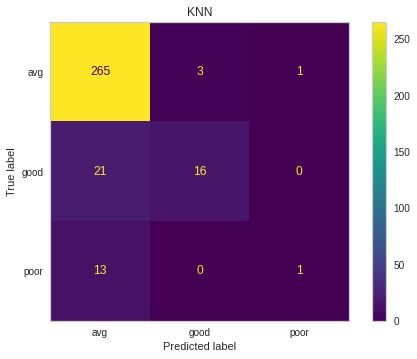

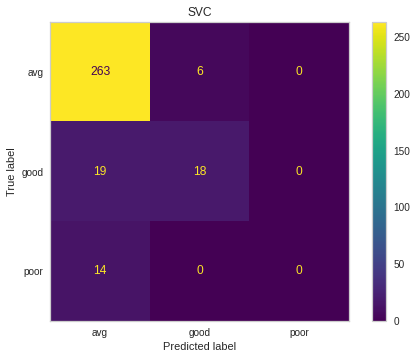

In [ ]:
# 1. Confusion Matrix
label = ['avg','good','poor']

plot_confusion_matrix(model_rf,X_test,y_test,display_labels=label)
plt.title("RF")
plt.grid(None)
plt.show()

plot_confusion_matrix(model_dt,X_test,y_test,display_labels=label)
plt.title("DT")
plt.grid(None)
plt.show()

plot_confusion_matrix(model_gnb,X_test,y_test,display_labels=label)
plt.title("GaussianNaiveBayes")
plt.grid(None)
plt.show()

plot_confusion_matrix(model_lr_sc,X_test_scaled,y_test,display_labels=label)
plt.title("LogR")
plt.grid(None)
plt.show()

plot_confusion_matrix(model_knn_sc,X_test_scaled,y_test,display_labels=label)
plt.title("KNN")
plt.grid(None)
plt.show()

plot_confusion_matrix(model_svc_sc,X_test_scaled,y_test,display_labels=label)
plt.title("SVC")
plt.grid(None)
plt.show()

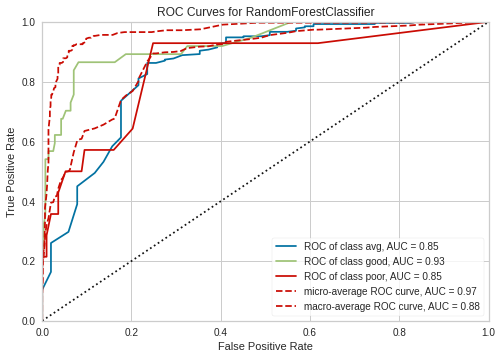

              precision    recall  f1-score   support

         avg       0.90      0.97      0.94       269
        good       0.75      0.57      0.65        37
        poor       1.00      0.07      0.13        14

    accuracy                           0.89       320
   macro avg       0.88      0.54      0.57       320
weighted avg       0.89      0.89      0.87       320



In [ ]:
# 2. roc_auc Visualization for Multiclass

visualiser1 = ROCAUC(model_rf, classes = ['avg','good','poor'])
visualiser1.fit(X_train,y_train)
visualiser1.score(X_test, y_test)
visualiser1.show()

labels = ['avg','good','poor']

print(classification_report(y_test,y_pred_rf, output_dict=False,target_names=labels))


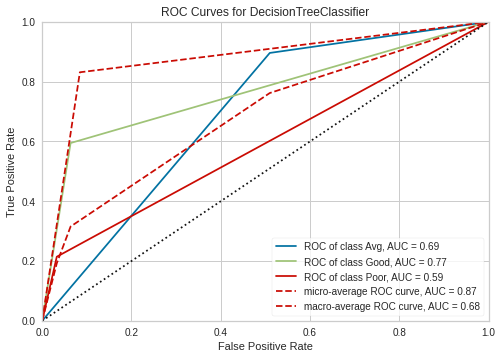

              precision    recall  f1-score   support

         avg       0.90      0.90      0.90       269
        good       0.55      0.59      0.57        37
        poor       0.23      0.21      0.22        14

    accuracy                           0.83       320
   macro avg       0.56      0.57      0.56       320
weighted avg       0.83      0.83      0.83       320



In [ ]:
visualiser2 = ROCAUC(model_dt, classes = ['Avg','Good','Poor'])
visualiser2.fit(X_train,y_train)
visualiser2.score(X_test, y_test)

visualiser2.show()

labels = ['avg','good','poor']

print(classification_report(y_test,y_pred_dt, output_dict=False,target_names=labels))

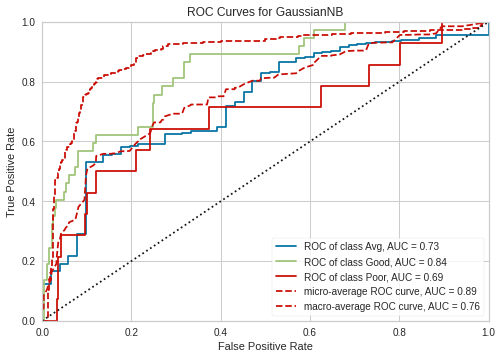

              precision    recall  f1-score   support

         avg       0.90      0.83      0.86       269
        good       0.41      0.59      0.48        37
        poor       0.19      0.21      0.20        14

    accuracy                           0.78       320
   macro avg       0.50      0.55      0.52       320
weighted avg       0.81      0.78      0.79       320



In [ ]:
visualiser3 = ROCAUC(model_gnb, classes = ['Avg','Good','Poor'])
visualiser3.fit(X_train,y_train)
visualiser3.score(X_test, y_test)

visualiser3.show()

labels = ['avg','good','poor']

print(classification_report(y_test,y_pred_nb, output_dict=False,target_names=labels))

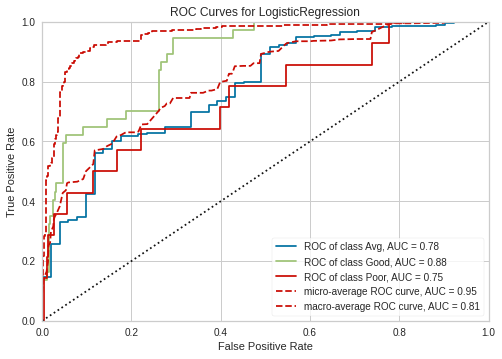

              precision    recall  f1-score   support

         avg       0.88      0.97      0.92       269
        good       0.65      0.41      0.50        37
        poor       0.00      0.00      0.00        14

    accuracy                           0.86       320
   macro avg       0.51      0.46      0.47       320
weighted avg       0.81      0.86      0.83       320



In [ ]:
visualiser4 = ROCAUC(model_lr_sc, classes = ['Avg','Good','Poor'])
visualiser4.fit(X_train_scaled,y_train)
visualiser4.score(X_test_scaled, y_test)

visualiser4.show()

labels = ['avg','good','poor']

print(classification_report(y_test,y_pred_lr_sc, output_dict=False,target_names=labels))

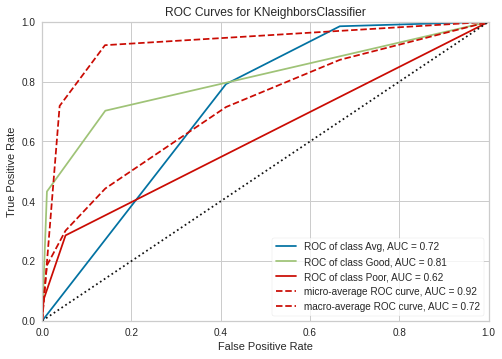

              precision    recall  f1-score   support

         avg       0.89      0.99      0.93       269
        good       0.84      0.43      0.57        37
        poor       0.50      0.07      0.12        14

    accuracy                           0.88       320
   macro avg       0.74      0.50      0.54       320
weighted avg       0.86      0.88      0.86       320



In [ ]:
visualiser5 = ROCAUC(model_knn_sc, classes = ['Avg','Good','Poor'])
visualiser5.fit(X_train_scaled,y_train)
visualiser5.score(X_test_scaled, y_test)

visualiser5.show()

labels = ['avg','good','poor']

print(classification_report(y_test,y_pred_knn_sc, output_dict=False,target_names=labels))

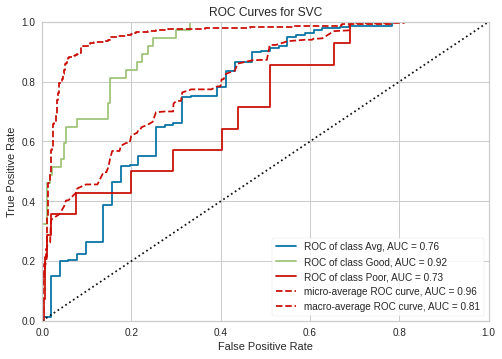

              precision    recall  f1-score   support

         avg       0.89      0.98      0.93       269
        good       0.75      0.49      0.59        37
        poor       0.00      0.00      0.00        14

    accuracy                           0.88       320
   macro avg       0.55      0.49      0.51       320
weighted avg       0.83      0.88      0.85       320



In [ ]:
visualiser6 = ROCAUC(model_svc_sc, classes = ['Avg','Good','Poor'])
visualiser6.fit(X_train_scaled,y_train)
visualiser6.score(X_test_scaled, y_test)

visualiser6.show()

labels = ['avg','good','poor']

print(classification_report(y_test,y_pred_svc_sc, output_dict=False,target_names=labels))

In [ ]:
# 3. precision_recall_curve Visualization

RF Model


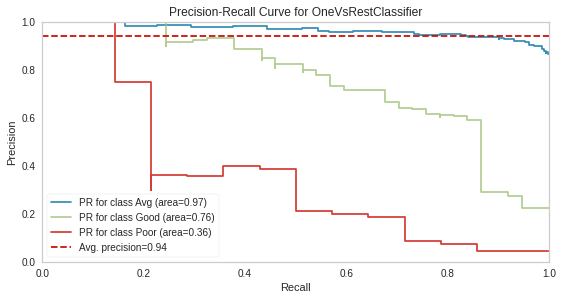

DT Model


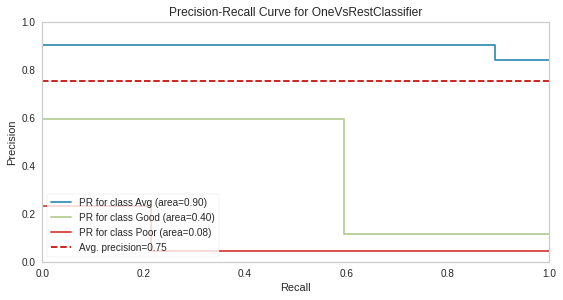

NB Model


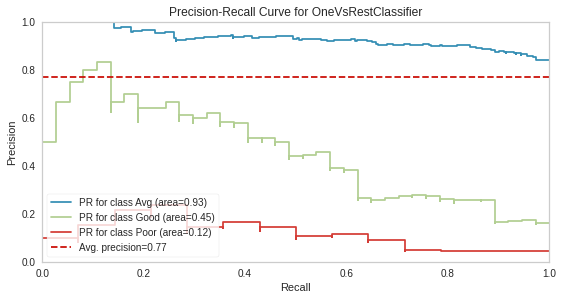

In [ ]:
# Tree Based Models

plt.figure(figsize=(20,15))
plt.subplot(321)
print("RF Model")
OvR = OneVsRestClassifier(model_rf)
viz =  PrecisionRecallCurve(OvR,classes=['Avg','Good','Poor'],per_class=True)
viz.fit(X_train, y_train)
viz.score(X_test,y_test)
viz.show()

plt.figure(figsize=(20,15))
plt.subplot(322)
print("DT Model")
OvR = OneVsRestClassifier(model_dt)
viz =  PrecisionRecallCurve(OvR,classes=['Avg','Good','Poor'],per_class=True)
viz.fit(X_train, y_train)
viz.score(X_test,y_test)
viz.show()

plt.figure(figsize=(20,15))
plt.subplot(323)
print("NB Model")
OvR = OneVsRestClassifier(model_gnb)
viz =  PrecisionRecallCurve(OvR,classes=['Avg','Good','Poor'],per_class=True)
viz.fit(X_train, y_train)
viz.score(X_test,y_test)
viz.show()

LogR Model


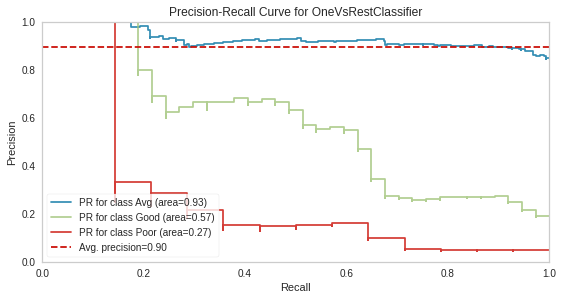

KNN Model


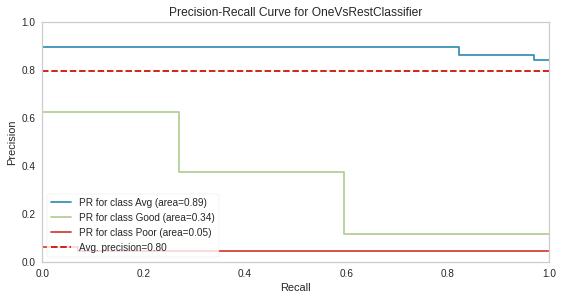

SVC Model


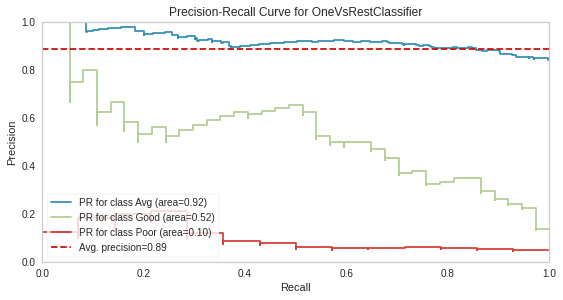

In [ ]:
# Distance Based Models

plt.figure(figsize=(20,15))
plt.subplot(321)
print("LogR Model")
OvR = OneVsRestClassifier(model_lr_sc)
viz =  PrecisionRecallCurve(OvR,classes=['Avg','Good','Poor'],per_class=True)
viz.fit(X_train, y_train)
viz.score(X_test,y_test)
viz.show()

plt.figure(figsize=(20,15))
plt.subplot(322)
print("KNN Model")
OvR = OneVsRestClassifier(model_knn_sc)
viz =  PrecisionRecallCurve(OvR,classes=['Avg','Good','Poor'],per_class=True)
viz.fit(X_train, y_train)
viz.score(X_test,y_test)
viz.show()

plt.figure(figsize=(20,15))
plt.subplot(323)
print("SVC Model")
OvR = OneVsRestClassifier(model_svc_sc)
viz =  PrecisionRecallCurve(OvR,classes=['Avg','Good','Poor'],per_class=True)
viz.fit(X_train, y_train)
viz.score(X_test,y_test)
viz.show()

In [ ]:
# 4. Calculating & Plotting Actual(y_test) Vs Predicted(y_pred)

Pred = pd.DataFrame({
                     'RF':(y_pred_rf),
                      'DT':(y_pred_dt),
                       'NB':(y_pred_nb),
                        'LogR':(y_pred_lr_sc),
                          'KNN' : (y_pred_knn_sc),
                            'SVC':(y_pred_svc_sc) 
                   })

dict = {0:'Avg',1:'Good',2:'Poor'}

# print("Actual y values")
# print(y_test.value_counts())
# print('RF Predictions')
# print(Pred['RF'].value_counts())
# print('DT Predictions')
# print(Pred['DT'].value_counts())
# print('NB Predictions')
# print(Pred['NB'].value_counts())


# print('LogR Predictions')
# print(Pred['LogR'].value_counts())
# print('KNN Predictions')
# print(Pred['KNN'].value_counts())
# print('SVC Predictions')
# print(Pred['SVC'].value_counts())
Pred.replace(dict,inplace=True) 
Pred

,RF,DT,NB,LogR,KNN,SVC
0,Avg,Avg,Avg,Avg,Avg,Avg
1,Avg,Avg,Avg,Avg,Avg,Avg
2,Avg,Avg,Avg,Avg,Avg,Avg
3,Avg,Avg,Good,Avg,Avg,Avg
4,Avg,Avg,Avg,Avg,Avg,Avg
...,...,...,...,...,...,...
315,Avg,Avg,Avg,Avg,Avg,Avg
316,Avg,Avg,Avg,Avg,Avg,Avg
317,Avg,Avg,Avg,Avg,Avg,Avg
318,Avg,Avg,Poor,Avg,Avg,Avg


In [ ]:
# Showing complete summary at a glance

uploaded = files.upload()
df_summary = io.BytesIO(uploaded['capstone_winequalitytesting.xlsx'])
df_first_sheet = pd.read_excel(df_summary, 'Sheet1')
df_second_sheet = pd.read_excel(df_summary, 'Sheet2')
df_third_sheet = pd.read_excel(df_summary, 'Sheet3')

Saving capstone_winequalitytesting.xlsx to capstone_winequalitytesting (13).xlsx


In [ ]:
df_first_sheet

,Classes,WineQuality_Cat,Class_ref,y_test,y_pred_rf,y_pred_dt,y_pred_nb,y_pred_logr,y_pred_knn,y_pred_svc
0,2,(0~4),Poor,14,1,13,16,0,2,0
1,0,(5~6),Avg,269,291,267,250,297,299,296
2,1,(7~8),Good,37,28,40,54,23,19,24


In [ ]:
df_second_sheet

,RF Model,precision,recall,f1_score,support,DT Model,precision.1,recall.1,f1_score.1,support.1,GNB Model,precision.2,recall.2,f1_score.2,support.2
0,avg,0.9,0.97,0.94,269,avg,0.9,0.9,0.9,269,avg,0.9,0.83,0.86,269
1,good,0.75,0.57,0.65,37,good,0.55,0.59,0.57,37,good,0.41,0.59,0.48,37
2,poor,1,0.07,0.13,14,poor,0.23,0.21,0.22,14,poor,0.19,0.21,0.2,14
3,accuracy,NaN,NaN,0.89,320,accuracy,NaN,NaN,0.83,320,accuracy,NaN,NaN,0.78,320
4,macro_avg,0.88,0.54,0.57,320,macro_avg,0.56,0.57,0.56,320,macro_avg,0.5,0.55,0.52,320
5,weighted_avg,0.89,0.89,0.87,320,weighted_avg,0.83,0.83,0.83,320,weighted_avg,0.81,0.78,0.79,320
6,LogR Model,precision,recall,f1_score,support,KNN Model,precision,recall,f1_score,support,SVM Model,precision,recall,f1_score,support
7,avg,0.88,0.97,0.92,269,avg,0.89,0.99,0.93,269,avg,0.89,0.98,0.93,269
8,good,0.65,0.41,0.5,37,good,0.84,0.43,0.57,37,good,0.75,0.49,0.59,37
9,poor,0,0,0,14,poor,0.5,0.07,0.12,14,poor,0,0,0,14


In [ ]:
scores_rf = cross_val_score(model_rf, X_train, y_train, cv=5)
scores_dt = cross_val_score(model_dt, X_train, y_train, cv=5)
scores_nb = cross_val_score(model_gnb, X_train, y_train, cv=5)
scores_lr = cross_val_score(model_lr_sc, X_train, y_train, cv=5)
scores_knn = cross_val_score(model_knn_sc, X_train, y_train, cv=5)
scores_svc = cross_val_score(model_svc_sc, X_train, y_train, cv=5)
# print("RF",scores_rf.mean(),scores_rf.std())
# print("DT",scores_dt.mean(),scores_dt.std())
# print("NB",scores_nb.mean(),scores_nb.std())
# print("LogR",scores_lr.mean(),scores_lr.std())
# print("KNN",scores_knn.mean(),scores_knn.std())
# print("SVC",scores_svc.mean(),scores_svc.std())
df_third_sheet

,cross_val_score,Mean,Std.dev.
0,RF,86.1593,0.0127
1,DT,80.9993,0.0166
2,GNB,76.8560,0.0292
3,LogR,83.1124,0.0065
4,KNN,83.1902,0.0085
5,SVM,82.0955,0.0012
